# **Download Yolov5 From Github**

In [4]:
import platform
print(platform.python_version())

3.7.10


In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 7241, done.
remote: Counting objects: 100% (363/363), done.
remote: Compressing objects: 100% (233/233), done.
remote: Total 7241 (delta 220), reused 230 (delta 130), pack-reused 6878
Receiving objects: 100% (7241/7241), 9.17 MiB | 32.17 MiB/s, done.
Resolving deltas: 100% (4945/4945), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


# **Prepare Environment**

In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 645kB 9.2MB/s 
Setup complete. Using torch 1.9.0+cu102 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


# **Connect With Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# **Download Image From RoboFlow**

In [ ]:
# Export code snippet and paste here

# Rotate+Brightness+Flip+Blur+Crop--636--1600 https://app.roboflow.com/ds/mERovx1GmA?key=CfPvOEm9V3 x
# Rotate+Brightness+Flip+Blur+Gray--636--1600 https://app.roboflow.com/ds/zpnImlwCmW?key=reUChdZmtm x
# Rotate+Brightness+Flip+Crop+Shear+Gray--636--1600
# Rotate+Brightness+Flip+Crop+Shear--636--1600
# Rotate+Brightness+Flip+Crop--636--1600 https://app.roboflow.com/ds/NhWxQHDwba?key=rJYqtSzJha 
# Rotate+Brightness+Flip+Gray--636--1600 https://app.roboflow.com/ds/NjHT1NaUBj?key=TUK86RDa3H v
# Rotate+Brightness+Flip--636--1600 https://app.roboflow.com/ds/kp9LcYLLPr?key=5Er4MRVC7H v
# Rotate+Brightness+Blur--636--1600 https://app.roboflow.com/ds/kpMoXRPWEw?key=pocQXmrxBn v
# Rotate+Brightness+Flip--636--1600 https://app.roboflow.com/ds/nOx1yXalf7?key=prHS29Bmgk v
# Rotate+Brightness--636--1600 https://app.roboflow.com/ds/EwPN28c5Wj?key=SfIgF5Sly6 v
# Rotate--636--1300 https://app.roboflow.com/ds/jcIe9MDISG?key=IHyh9dFu85 v
# Brightness--636-1600 https://app.roboflow.com/ds/V53TuCcgte?key=JIwulxBl3j v

# Rotate+Brightness--683--1700 https://app.roboflow.com/ds/nZq1hImwaZ?key=dPDqiQPGdR v
# Rotate+Brightness+Flip--683--1700 https://app.roboflow.com/ds/6Tq4fVAjwa?key=EVVsbhbyQC v
# Rotate+Brightness+Flip+Gray--683--1700 https://app.roboflow.com/ds/2nCYygNeab?key=qMFkktWLa1 v

%cd /content
!curl -L "https://app.roboflow.com/ds/nZq1hImwaZ?key=dPDqiQPGdR" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1792      0 --:--:-- --:--:-- --:--:--  1792
100 31.9M  100 31.9M    0     0  30.4M      0  0:00:01  0:00:01 --:--:-- 93.1M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/20210614_215314_jpg.rf.2f35ce1bd821b78f99343a379965c1f7.jpg  
 extracting: test/images/20210614_215411_jpg.rf.98c16ee07bf4805aaeec909e7213e769.jpg  
 extracting: test/images/20210614_215455_jpg.rf.172289a52bd642252d5bf10068508cc0.jpg  
 extracting: test/images/20210614_215524_jpg.rf.4932e1d203a9e6e26058a01e49a0aa59.jpg  
 extracting: test/images/20210614_215607_jpg.rf.eb41de8cbae9fb4999648b951c4e44a4.jpg  
 extracting: test/images/20210614_215701_jpg.rf.db0355bb040745bb83c0aa1699c71149.jpg  
 extracti

**Output Class Name**

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 4
names: ['1', '10', '5', '50']

# **Define Model Configuration and Architecture**

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# **Train Custom YOLOv5 Detector**

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 284 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='../data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --logd

# **Evaluate Custom YOLOv5 Detector Performance**

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

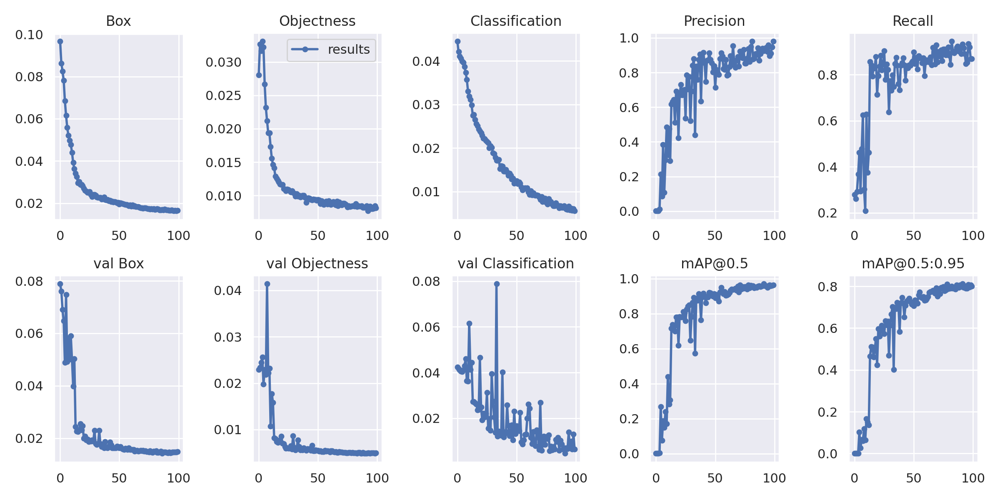

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

**Visualize Our Training Data**

GROUND TRUTH TRAINING DATA:


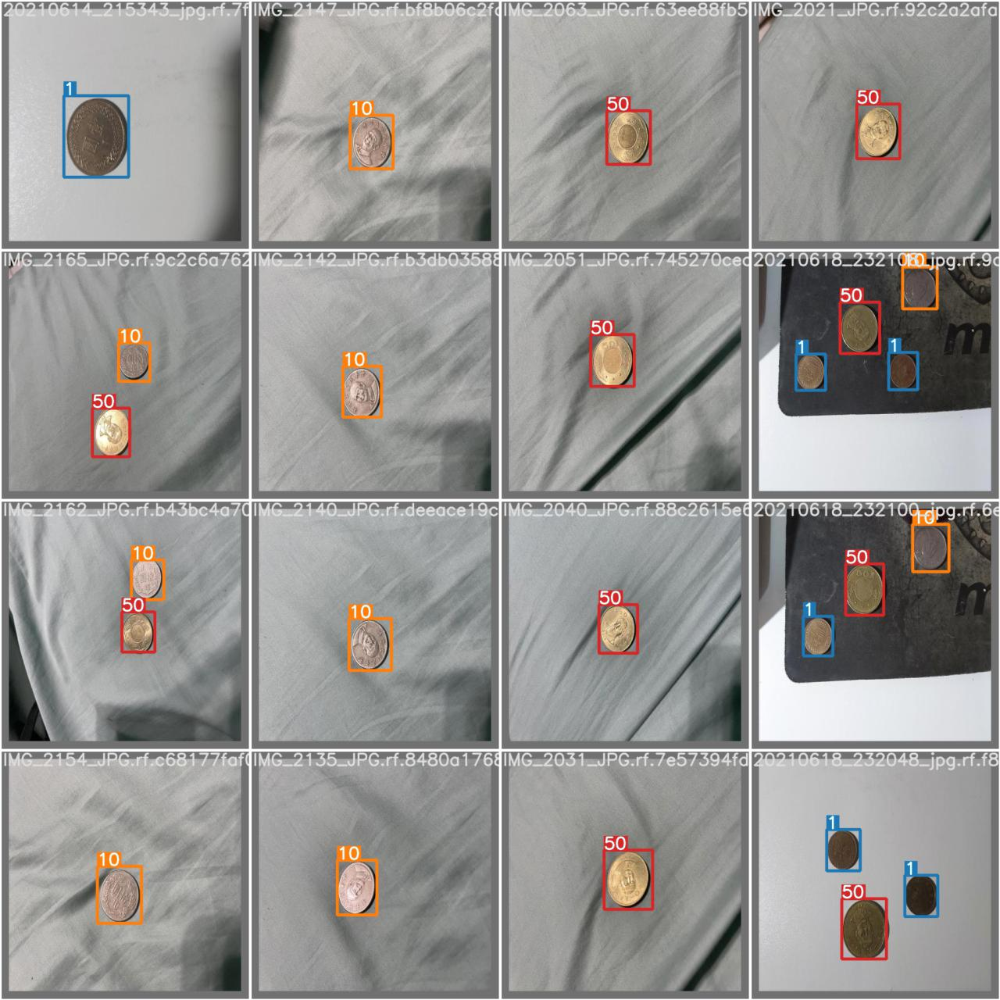

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=900)

# **Testing Time**

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.5 --save-txt --save-conf --source ../test/images #../gdrive/MyDrive/20210616.jpg # ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.5, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=True, save_txt=True, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 232 layers, 7254609 parameters, 0 gradients, 16.8 GFLOPS
image 1/68 /content/yolov5/../test/images/20210614_215314_jpg.rf.2f35ce1bd821b78f99343a379965c1f7.jpg: 416x

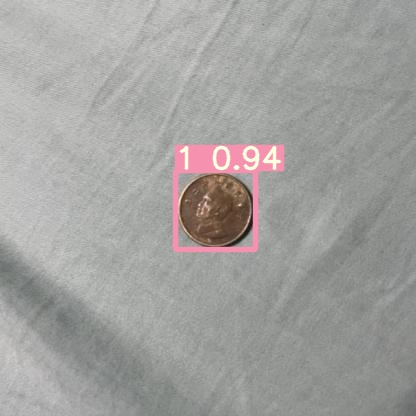

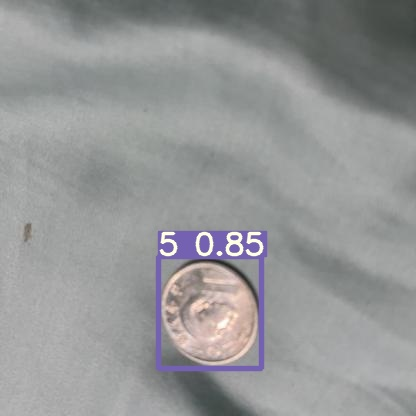

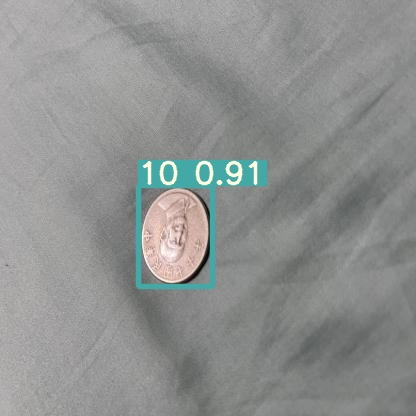

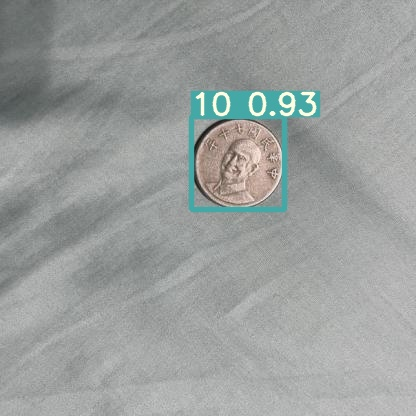

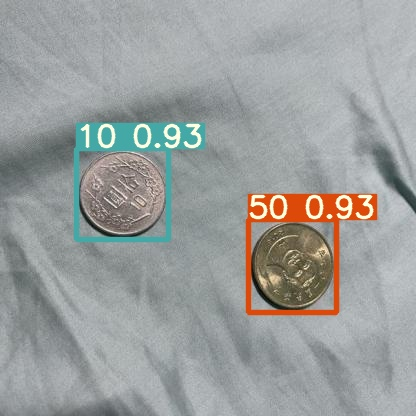

...

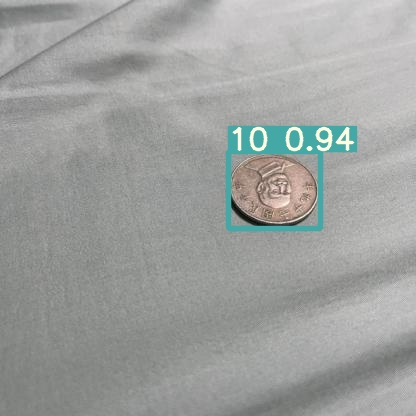

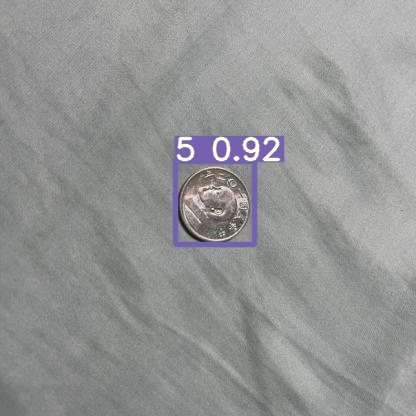

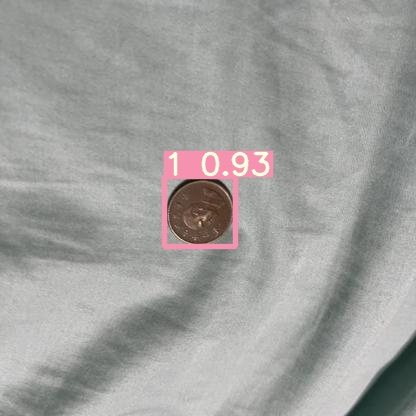

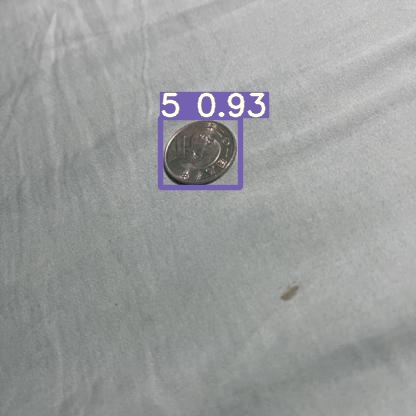

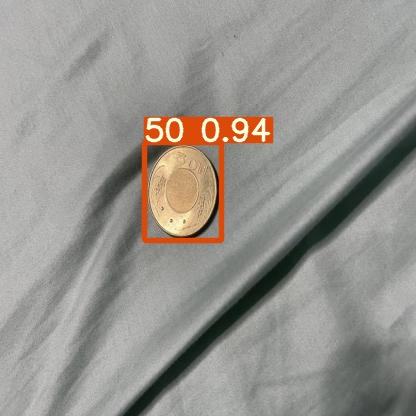

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

**Calculate the Money and Trouble Shooting**

In [ ]:
import glob
path = glob.glob('/content/yolov5/runs/detect/exp/labels/*.txt')

for num in range(len(path)):
  f = open(path[num], 'r')
  classIndex, boundingBox = [], []
  for line in f.readlines():
    index = line.find(" ")
    classIndex.append(line[0:index])
    boundingBox.append(line[index+1:-1].split())

  difference = []
  # detecting overlapping bounding boxes
  for i in range(len(boundingBox)):
    difference.append([1] * (len(boundingBox)))
    for j in range(len(boundingBox)):
      if(abs(float(boundingBox[i][0])-float(boundingBox[j][0]))>0.01 or abs(float(boundingBox[i][1])-float(boundingBox[j][1]))>0.01): difference[i][j] = 1
      else: difference[i][j] = 0

  for i in range(len(boundingBox)):
    for j in range(len(boundingBox)):
      if(i!=j and not difference[i][j]):
        # compare with the confidence
        if(boundingBox[i][4]>boundingBox[j][4]): classIndex[j] = 4
        elif(boundingBox[i][4]<=boundingBox[j][4]): classIndex[i] = 4 
        print("Overlap Detected: Confindence Comparison %s vs %s" %(boundingBox[i][4], boundingBox[j][4]))

  # counting total dollars
  totalDollar = 0
  for coin in classIndex:
    if(coin == '0'): totalDollar += 1
    elif(coin == '1'): totalDollar += 10
    elif(coin == '2'): totalDollar += 5
    elif(coin == '3'): totalDollar += 50

  print("Image: %s\tTotal: %d NTD" %(path[num][0:-4]+".jpg", totalDollar))

Image: /content/yolov5/runs/detect/exp/labels/20210615_012211821_iOS_jpg.rf.3e7ced08d3d644861386bb40e77b248a.jpg	Total: 1 NTD
Image: /content/yolov5/runs/detect/exp/labels/IMG_E2026_JPG.rf.d3d8cbddb77b172c24cee2294ecdc042.jpg	Total: 50 NTD
Image: /content/yolov5/runs/detect/exp/labels/20210614_215733_jpg.rf.d5c01f88fbacae84278c38e8df996883.jpg	Total: 131 NTD
Image: /content/yolov5/runs/detect/exp/labels/20210615_011605655_iOS_jpg.rf.2bf9b8b35459eab893bbba9d1193360d.jpg	Total: 5 NTD
Image: /content/yolov5/runs/detect/exp/labels/20210615_012504113_iOS_jpg.rf.cc7b8426d9ad5f31ff36743e6fc3fbc9.jpg	Total: 1 NTD
Image: /content/yolov5/runs/detect/exp/labels/IMG_E2080_JPG.rf.0a11530ba0b7fdff329877fd1cd588a6.jpg	Total: 10 NTD
Image: /content/yolov5/runs/detect/exp/labels/20210615_012240501_iOS_jpg.rf.72b2140fda649722dfb251a9ed2a226c.jpg	Total: 1 NTD
Image: /content/yolov5/runs/detect/exp/labels/20210615_011711418_iOS_jpg.rf.2dbd74d2b6d6ffae6eefee7fc55b6cba.jpg	Total: 5 NTD
Image: /content/yolov

# **Export Trained Weights**

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

**Download txt files**

In [ ]:
!zip -r /content/test/labels.zip /content/test/labels
!zip -r /content/yolov5/runs/detect/exp/labels.zip /content/yolov5/runs/detect/exp/labels
from google.colab import files
files.download("/content/test/labels.zip")
files.download("/content/yolov5/runs/detect/exp/labels.zip")

  adding: content/test/labels/ (stored 0%)
  adding: content/test/labels/20210615_012211821_iOS_jpg.rf.3e7ced08d3d644861386bb40e77b248a.txt (deflated 34%)
  adding: content/test/labels/IMG_E2026_JPG.rf.d3d8cbddb77b172c24cee2294ecdc042.txt (deflated 38%)
  adding: content/test/labels/20210614_215733_jpg.rf.d5c01f88fbacae84278c38e8df996883.txt (deflated 68%)
  adding: content/test/labels/20210615_011605655_iOS_jpg.rf.2bf9b8b35459eab893bbba9d1193360d.txt (deflated 36%)
  adding: content/test/labels/20210615_012504113_iOS_jpg.rf.cc7b8426d9ad5f31ff36743e6fc3fbc9.txt (deflated 31%)
  adding: content/test/labels/IMG_E2080_JPG.rf.0a11530ba0b7fdff329877fd1cd588a6.txt (deflated 35%)
  adding: content/test/labels/20210615_012240501_iOS_jpg.rf.72b2140fda649722dfb251a9ed2a226c.txt (deflated 38%)
  adding: content/test/labels/20210615_011711418_iOS_jpg.rf.2dbd74d2b6d6ffae6eefee7fc55b6cba.txt (deflated 34%)
  adding: content/test/labels/IMG_2052_JPG.rf.1bea6ba30ba6876a3987e5582ec27c4d.txt (deflated 3

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>